![NYC Skyline](nyc.jpg)

Welcome to New York City, one of the most-visited cities in the world. There are many Airbnb listings in New York City to meet the high demand for temporary lodging for travelers, which can be anywhere between a few nights to many months. In this project, we will take a closer look at the New York Airbnb market by combining data from multiple file types like `.csv`, `.tsv`, and `.xlsx`.

Recall that **CSV**, **TSV**, and **Excel** files are three common formats for storing data. 
Three files containing data on 2019 Airbnb listings are available to you:

**data/airbnb_price.csv**
This is a CSV file containing data on Airbnb listing prices and locations.
- **`listing_id`**: unique identifier of listing
- **`price`**: nightly listing price in USD
- **`nbhood_full`**: name of borough and neighborhood where listing is located

**data/airbnb_room_type.xlsx**
This is an Excel file containing data on Airbnb listing descriptions and room types.
- **`listing_id`**: unique identifier of listing
- **`description`**: listing description
- **`room_type`**: Airbnb has three types of rooms: shared rooms, private rooms, and entire homes/apartments

**data/airbnb_last_review.tsv**
This is a TSV file containing data on Airbnb host names and review dates.
- **`listing_id`**: unique identifier of listing
- **`host_name`**: name of listing host
- **`last_review`**: date when the listing was last reviewed

In [1]:
# Import necessary packages
import pandas as pd
import numpy as np

# Begin coding here ...
# Use as many cells as you like

In [2]:
# Load data into dataframes.
airbnb_price = pd.read_csv("C:/EDA-Project-Airbnb-Market-Trends-main/data/airbnb_price.csv",  sep=",") 
airbnb_room_type = pd.read_excel("C:/EDA-Project-Airbnb-Market-Trends-main/data/airbnb_room_type.xlsx")
airbnb_last_review = pd.read_csv("C:/EDA-Project-Airbnb-Market-Trends-main/data/airbnb_last_review.tsv", sep="\t") 

print("Airbnb Price \n", airbnb_price.head())
print("Airbnb Room Type \n", airbnb_room_type.head())
print("Airbnb Last Review \n", airbnb_last_review.head()) 

Airbnb Price 
    listing_id        price                nbhood_full
0        2595  225 dollars         Manhattan, Midtown
1        3831   89 dollars     Brooklyn, Clinton Hill
2        5099  200 dollars     Manhattan, Murray Hill
3        5178   79 dollars  Manhattan, Hell's Kitchen
4        5238  150 dollars       Manhattan, Chinatown
Airbnb Room Type 
    listing_id                                description        room_type
0        2595                      Skylit Midtown Castle  Entire home/apt
1        3831            Cozy Entire Floor of Brownstone  Entire home/apt
2        5099  Large Cozy 1 BR Apartment In Midtown East  Entire home/apt
3        5178            Large Furnished Room Near B'way     private room
4        5238         Cute & Cozy Lower East Side 1 bdrm  Entire home/apt
Airbnb Last Review 
    listing_id    host_name   last_review
0        2595     Jennifer   May 21 2019
1        3831  LisaRoxanne  July 05 2019
2        5099        Chris  June 22 2019
3        5178

# Merging the DataFrames to one single DataFrame
## We merge the cells so that the listing can be analyzed together, thus making it more efficient and easier to process any analysis for these datasets.

In [3]:
airbnb_listings = pd.merge(airbnb_price, airbnb_room_type, on="listing_id")
airbnb_listings = pd.merge(airbnb_listings, airbnb_last_review, on="listing_id")

airbnb_listings.head()

,listing_id,price,nbhood_full,description,room_type,host_name,last_review
0,2595,225 dollars,"Manhattan, Midtown",Skylit Midtown Castle,Entire home/apt,Jennifer,May 21 2019
1,3831,89 dollars,"Brooklyn, Clinton Hill",Cozy Entire Floor of Brownstone,Entire home/apt,LisaRoxanne,July 05 2019
2,5099,200 dollars,"Manhattan, Murray Hill",Large Cozy 1 BR Apartment In Midtown East,Entire home/apt,Chris,June 22 2019
3,5178,79 dollars,"Manhattan, Hell's Kitchen",Large Furnished Room Near B'way,private room,Shunichi,June 24 2019
4,5238,150 dollars,"Manhattan, Chinatown",Cute & Cozy Lower East Side 1 bdrm,Entire home/apt,Ben,June 09 2019


# Exploratory Data Analysis

In [4]:
# Doing an EDA to understand about the dataset
airbnb_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25209 entries, 0 to 25208
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   listing_id   25209 non-null  int64 
 1   price        25209 non-null  object
 2   nbhood_full  25209 non-null  object
 3   description  25199 non-null  object
 4   room_type    25209 non-null  object
 5   host_name    25201 non-null  object
 6   last_review  25209 non-null  object
dtypes: int64(1), object(6)
memory usage: 1.3+ MB


# Based on our DataFrame information, we notice that we need to change some datatypes of some columns.
## We're changing the following:
- price as integer datatype.
- room_type to be lowercase to be consistent
- last_review as datetime datatype.

In [5]:
# Update price to decimal format
airbnb_listings["price"] = airbnb_listings["price"].str.replace(" dollars", "").astype(int)



In [6]:
# Update room_type to be lowercase.
airbnb_listings["room_type"] = airbnb_listings["room_type"].str.lower()

In [7]:
# Update last_review to date format.
airbnb_listings["last_review"] = pd.to_datetime(airbnb_listings['last_review'], format='%B %d %Y')

In [8]:
# Find the top 10 listing with smallest listing price.
lowest_price_listing = airbnb_listings.nsmallest(10, "price")[["listing_id", "price"]]

In [9]:
# Find the top 10 listing with highest listing price.
highest_price_listing = airbnb_listings.nlargest(10, "price")[["listing_id", "price"]]

In [10]:
print("Top 10 Lowest Prices: \n", lowest_price_listing)
print("\nTop 10 Highest Prices: \n", highest_price_listing)

Top 10 Lowest Prices: 
        listing_id  price
10861    20333471      0
10958    20523843      0
11023    20639628      0
11024    20639792      0
11025    20639914      0
11577    21291569      0
11589    21304320      0
9686     18490141     10
12135    21869057     10
13894    24412104     10

Top 10 Highest Prices: 
        listing_id  price
23916    34895693   7500
22085    33397385   5100
18430    30035166   5000
21731    33029434   3613
12508    22263855   3000
24432    35297214   2995
13528    23860219   2990
21838    33133321   2600
1234       893413   2500
14282    25018204   2500


In [11]:
# View the dataset information again.
airbnb_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25209 entries, 0 to 25208
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   listing_id   25209 non-null  int64         
 1   price        25209 non-null  int32         
 2   nbhood_full  25209 non-null  object        
 3   description  25199 non-null  object        
 4   room_type    25209 non-null  object        
 5   host_name    25201 non-null  object        
 6   last_review  25209 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int32(1), int64(1), object(4)
memory usage: 1.3+ MB


In [12]:
# View the statistical analysis for price
airbnb_listings.describe()

,listing_id,price,last_review
count,2.520900e+04,25209.000000,25209
mean,2.068922e+07,141.777936,2019-05-30 07:58:41.171010560
min,2.595000e+03,0.000000,2019-01-01 00:00:00
25%,1.202273e+07,69.000000,2019-05-23 00:00:00
50%,2.234391e+07,105.000000,2019-06-18 00:00:00
75%,3.037669e+07,175.000000,2019-06-29 00:00:00
max,3.645581e+07,7500.000000,2019-07-09 00:00:00
std,1.102928e+07,147.349137,NaN


In [13]:
# View the updated DataFrame.
airbnb_listings.head()

,listing_id,price,nbhood_full,description,room_type,host_name,last_review
0,2595,225,"Manhattan, Midtown",Skylit Midtown Castle,entire home/apt,Jennifer,2019-05-21
1,3831,89,"Brooklyn, Clinton Hill",Cozy Entire Floor of Brownstone,entire home/apt,LisaRoxanne,2019-07-05
2,5099,200,"Manhattan, Murray Hill",Large Cozy 1 BR Apartment In Midtown East,entire home/apt,Chris,2019-06-22
3,5178,79,"Manhattan, Hell's Kitchen",Large Furnished Room Near B'way,private room,Shunichi,2019-06-24
4,5238,150,"Manhattan, Chinatown",Cute & Cozy Lower East Side 1 bdrm,entire home/apt,Ben,2019-06-09


# 1. Finding the Earliest and Most Recent Reviews Dates
## Task: What are the dates of the earliest and most recent reviews? Store these values as two separate variables with your preferred names.

In [14]:
first_reviewed = airbnb_listings["last_review"].min()
last_reviewed = airbnb_listings["last_review"].max()

print(f"The earliest reviews {first_reviewed.strftime('%b %d %Y')} and most recent reviews were done on {last_reviewed.strftime('%b %d %Y')}.")

The earliest reviews Jan 01 2019 and most recent reviews were done on Jul 09 2019.


# 2. Determining the count of private rooms
## Task: How many of the listings are private rooms? Save this into any variable.

In [15]:
nb_private_rooms = (airbnb_listings["room_type"] == "private room").sum()
print(f"Out of all the listings, {nb_private_rooms} are private rooms.")

Out of all the listings, 11356 are private rooms.


# 3. Determining the average listing price
## Task: What is the average listing price? Round to the nearest two decimal places and save into a variable.

In [16]:
avg_price = round(airbnb_listings["price"].mean(), 2)
avg_price

141.78

# 4. Creating a new DataFrame with combined data
Task: Combine the new variables into one DataFrame called review_dates with four columns in the following order: first_reviewed, last_reviewed, nb_private_rooms, and avg_price. The DataFrame should only contain one row of values.

In [17]:
# Create the DataFrame
review_dates = pd.DataFrame({
    'first_reviewed': [first_reviewed],
    'last_reviewed': [last_reviewed],
    'nb_private_rooms': [nb_private_rooms],
    'avg_price': [avg_price]
})


In [18]:
review_dates

,first_reviewed,last_reviewed,nb_private_rooms,avg_price
0,2019-01-01,2019-07-09,11356,141.78


# 5 - Intermediate Analysis
## Neighborhood Trends

Which neighborhoods have the highest and lowest average listing prices?
Create a DataFrame with columns neighborhood, average_price, and number_of_listings for the top 5 most expensive neighborhoods.

In [19]:
# Group by neighborhood and calculate average price and number of listings
neighborhood_stats = airbnb_listings.groupby('nbhood_full').agg(
    average_price=('price', 'mean'),
    number_of_listings=('listing_id', 'count')
)

# Sort neighborhoods by average price in descending order to get the most expensive ones
neighborhood_stats_sorted = neighborhood_stats.sort_values(by='average_price', ascending=False)

# Get the top 5 most expensive neighborhoods
top_5_expensive_neighborhoods = neighborhood_stats_sorted.head(5)

# Reset the index to have 'neighborhood' as a column
top_5_expensive_neighborhoods = top_5_expensive_neighborhoods.reset_index()

# Display the result
print(top_5_expensive_neighborhoods)


                    nbhood_full  average_price  number_of_listings
0            Brooklyn, Sea Gate     805.000000                   2
1            Manhattan, Tribeca     396.704918                  61
2  Manhattan, Flatiron District     342.055556                  36
3               Manhattan, NoHo     335.024390                  41
4               Manhattan, SoHo     299.162304                 191


# 6 - Word Analysis in Descriptions

Find the top 10 most frequently used words in the description column (excluding stopwords like "the," "and," etc.).
Use pandas.Series.str.split and explore the Counter class from the collections module.

In [20]:
from collections import Counter
import string

# Sample data
airbnb_listings['description']

# Define a list of stopwords (expand this list as needed)
stopwords = set(["the", "and", "of", "in", "to", "a", "this", "with", "near", "close", "is"])

# Tokenize and clean the text
words = (
    airbnb_listings['description']
    .str.lower()  # Convert to lowercase
    .str.translate(str.maketrans("", "", string.punctuation))  # Remove punctuation
    .str.split()  # Split into words
    .explode()  # Flatten the lists into a single Series
)

# Filter out stopwords
filtered_words = words[~words.isin(stopwords)]

# Count word frequencies
word_counts = Counter(filtered_words)

# Get the top 10 most frequent words
top_10_words = word_counts.most_common(10)

# Display the result
print(pd.DataFrame(top_10_words, columns=["word", "frequency"]))


        word  frequency
0       room       5130
1    private       4092
2    bedroom       3678
3  apartment       3281
4       cozy       2737
5        apt       2230
6   brooklyn       2162
7  manhattan       2022
8     studio       1967
9          2       1863


# Bar Chart
## Create a bar chart showing the count of listings for each room type.
Add proper labels, titles, and a legend.

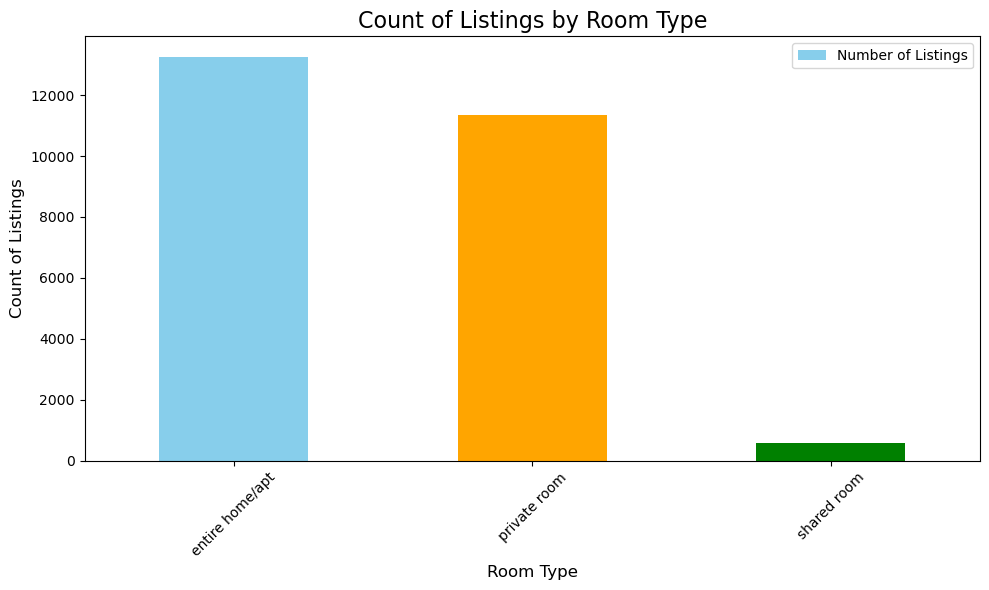

In [22]:
import matplotlib.pyplot as plt

# Count listings by room type
room_type_counts = airbnb_listings['room_type'].value_counts()

# Create the bar chart
plt.figure(figsize=(10, 6))
room_type_counts.plot(kind='bar', color=['skyblue', 'orange', 'green', 'red'])

# Add titles and labels
plt.title('Count of Listings by Room Type', fontsize=16)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Count of Listings', fontsize=12)
plt.xticks(rotation=45)
plt.legend(['Number of Listings'], loc='upper right')

# Show the plot
plt.tight_layout()
plt.show()


# Heatmap
## Generate a heatmap to show the correlation (if any) between listing price and the frequency of reviews.
Use the sns.heatmap function.

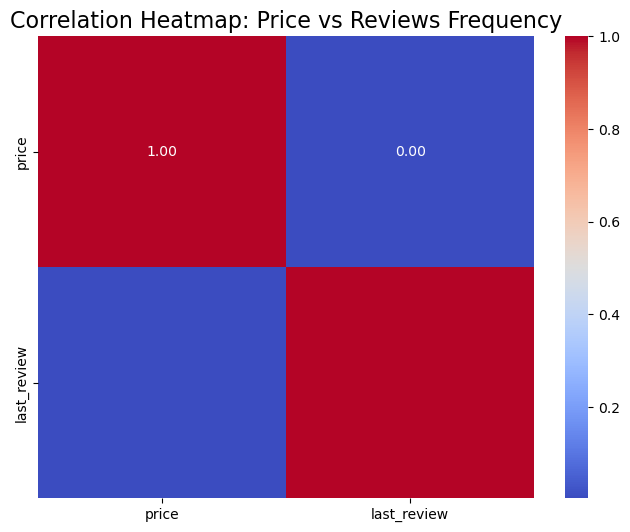

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure the necessary columns are numerical
airbnb_listings['price'] = pd.to_numeric(airbnb_listings['price'], errors='coerce')
airbnb_listings['last_review'] = pd.to_numeric(airbnb_listings['last_review'], errors='coerce')

# Drop rows with missing values in these columns
data_cleaned = airbnb_listings[['price', 'last_review']].dropna()

# Calculate correlation
correlation_matrix = data_cleaned.corr() 

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')

# Add titles and labels
plt.title('Correlation Heatmap: Price vs Reviews Frequency', fontsize=16)
plt.show()



In [25]:
airbnb_listings.head()

,listing_id,price,nbhood_full,description,room_type,host_name,last_review
0,2595,225,"Manhattan, Midtown",Skylit Midtown Castle,entire home/apt,Jennifer,2019-05-21
1,3831,89,"Brooklyn, Clinton Hill",Cozy Entire Floor of Brownstone,entire home/apt,LisaRoxanne,2019-07-05
2,5099,200,"Manhattan, Murray Hill",Large Cozy 1 BR Apartment In Midtown East,entire home/apt,Chris,2019-06-22
3,5178,79,"Manhattan, Hell's Kitchen",Large Furnished Room Near B'way,private room,Shunichi,2019-06-24
4,5238,150,"Manhattan, Chinatown",Cute & Cozy Lower East Side 1 bdrm,entire home/apt,Ben,2019-06-09


# Pie Chart
## Create a pie chart to visualize the proportion of room types available.

Use a custom color palette and annotate the chart with percentages.

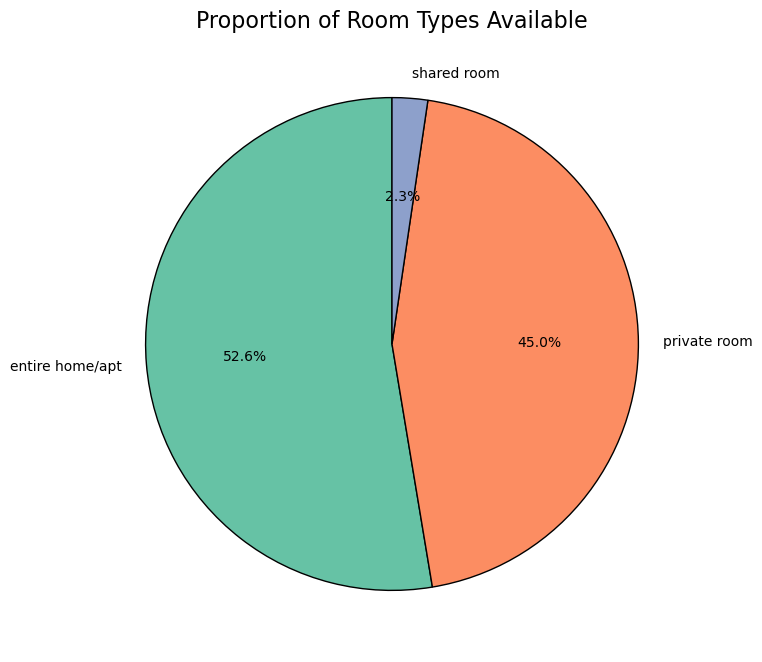

In [38]:
import pandas as pd
import matplotlib.pyplot as plt

# Count the room types
room_type_counts = airbnb_listings['room_type'].value_counts()

# Create the pie chart
colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3']  # Custom color palette
plt.figure(figsize=(8, 8))
room_type_counts.plot.pie(
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors, 
    wedgeprops={'edgecolor': 'black'}
)

# Add title and format
plt.title('Proportion of Room Types Available', fontsize=16)
plt.ylabel('')  # Remove y-axis label for better aesthetics
plt.show()


# Histogram
## Plot a histogram showing the distribution of listing prices.
Use bins to group prices in increments of $50.

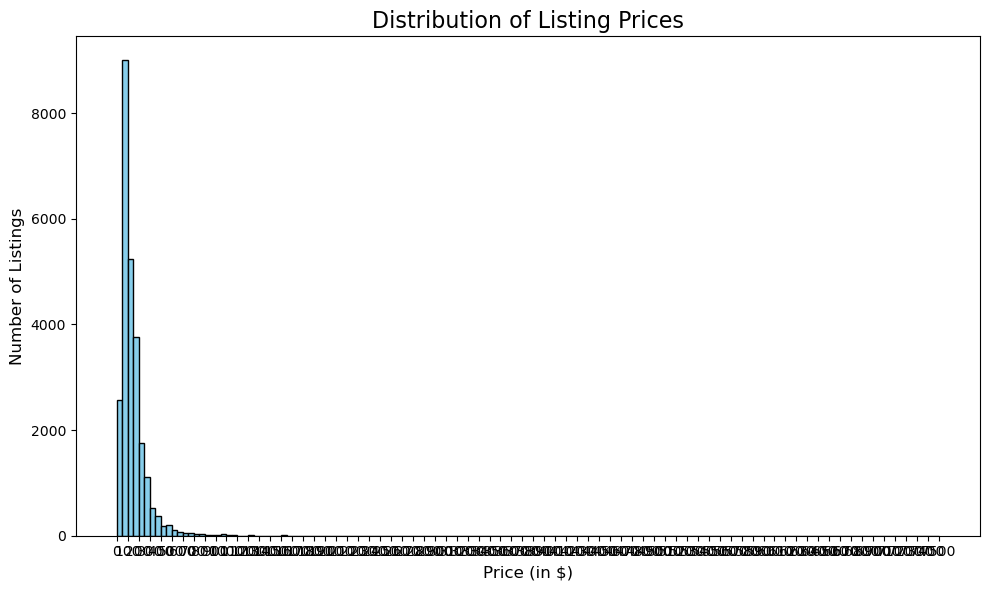

In [39]:
# Ensure the 'price' column is numeric for the histogram
airbnb_listings['price'] = pd.to_numeric(airbnb_listings['price'], errors='coerce')

# Drop rows with missing or invalid prices
price_data = airbnb_listings['price'].dropna()

# Create the histogram
plt.figure(figsize=(10, 6))
plt.hist(price_data, bins=range(0, int(price_data.max()) + 50, 50), color='skyblue', edgecolor='black')

# Add titles and labels
plt.title('Distribution of Listing Prices', fontsize=16)
plt.xlabel('Price (in $)', fontsize=12)
plt.ylabel('Number of Listings', fontsize=12)
plt.xticks(range(0, int(price_data.max()) + 100, 100))

# Show the plot
plt.tight_layout()
plt.show()


# Violin Plot
##Create a violin plot to compare price distributions across neighborhoods.


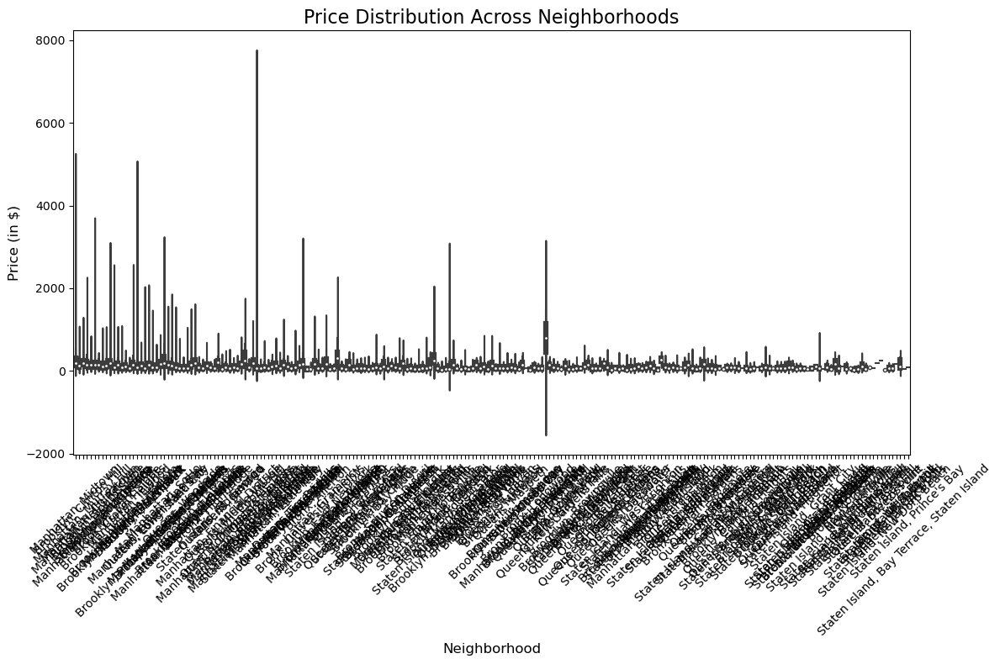

In [40]:
# Ensure the 'price' column is numeric
airbnb_listings['price'] = pd.to_numeric(airbnb_listings['price'], errors='coerce')

# Drop rows with missing values in 'price' or 'nbhood_full'
data_cleaned = airbnb_listings[['price', 'nbhood_full']].dropna()

# Create the violin plot
plt.figure(figsize=(12, 8))
sns.violinplot(data=data_cleaned, x='nbhood_full', y='price', palette='muted')

# Add titles and labels
plt.title('Price Distribution Across Neighborhoods', fontsize=16)
plt.xlabel('Neighborhood', fontsize=12)
plt.ylabel('Price (in $)', fontsize=12)
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


In [41]:
airbnb_listings.head()

,listing_id,price,nbhood_full,description,room_type,host_name,last_review
0,2595,225,"Manhattan, Midtown",Skylit Midtown Castle,entire home/apt,Jennifer,1558396800000000000
1,3831,89,"Brooklyn, Clinton Hill",Cozy Entire Floor of Brownstone,entire home/apt,LisaRoxanne,1562284800000000000
2,5099,200,"Manhattan, Murray Hill",Large Cozy 1 BR Apartment In Midtown East,entire home/apt,Chris,1561161600000000000
3,5178,79,"Manhattan, Hell's Kitchen",Large Furnished Room Near B'way,private room,Shunichi,1561334400000000000
4,5238,150,"Manhattan, Chinatown",Cute & Cozy Lower East Side 1 bdrm,entire home/apt,Ben,1560038400000000000


# Outlier Detection
## Identify listings with unusually high prices (outliers) using the interquartile range (IQR) method.
Highlight these listings in a scatter plot.

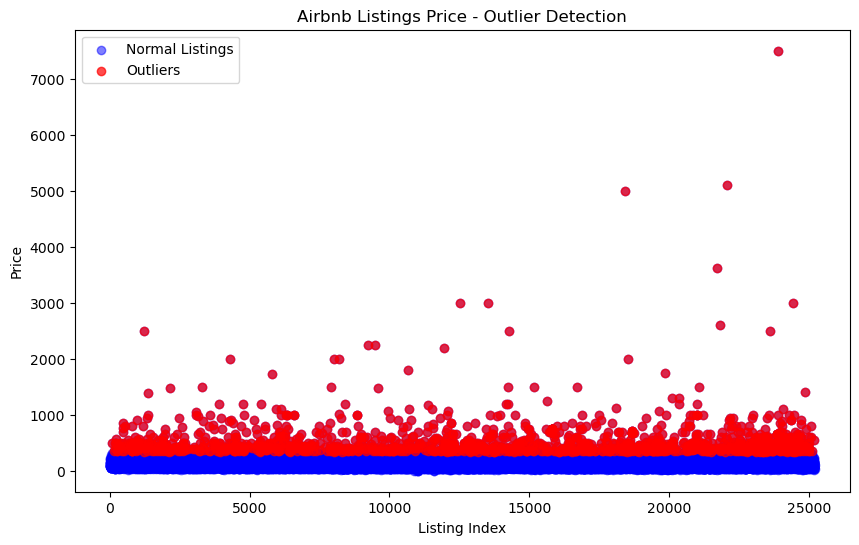

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming airbnb_listings is the DataFrame containing the data
# airbnb_listings = pd.read_csv("path_to_file.csv")  # Uncomment if you need to load from file

# Calculate IQR for price column
Q1 = airbnb_listings['price'].quantile(0.25)
Q3 = airbnb_listings['price'].quantile(0.75)
IQR = Q3 - Q1

# Define the outlier threshold
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = airbnb_listings[(airbnb_listings['price'] < lower_bound) | (airbnb_listings['price'] > upper_bound)]

# Scatter plot with outliers highlighted
plt.figure(figsize=(10, 6))
plt.scatter(airbnb_listings.index, airbnb_listings['price'], label='Normal Listings', color='blue', alpha=0.5)
plt.scatter(outliers.index, outliers['price'], label='Outliers', color='red', alpha=0.7)
plt.xlabel('Listing Index')
plt.ylabel('Price')
plt.title('Airbnb Listings Price - Outlier Detection')
plt.legend()
plt.show()


# Interactive Visualization
## Explore plotly or altair to create an interactive visualization for price trends by neighborhood.
Include tooltips to display additional information such as room_type and description.

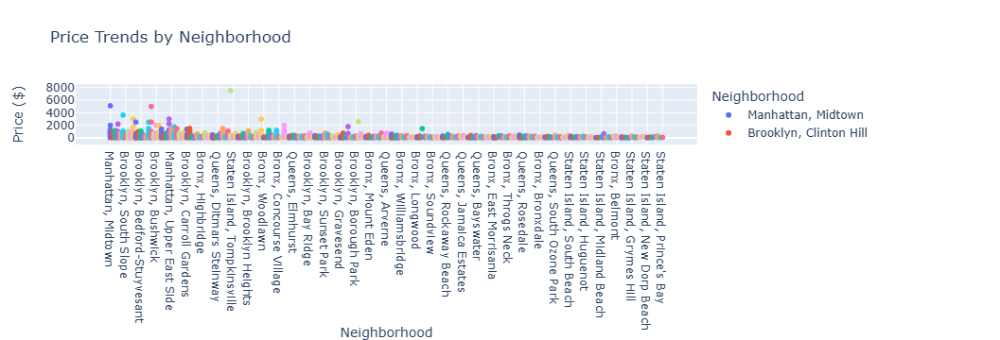

In [46]:
import plotly.express as px

# Create an interactive scatter plot with tooltips
fig = px.scatter(
    airbnb_listings, 
    x="nbhood_full",  # Neighborhood column
    y="price", 
    color="nbhood_full",  # Coloring by neighborhood
    hover_data=["room_type", "description"],  # Add tooltips for room type and description
    title="Price Trends by Neighborhood",
    labels={"price": "Price ($)", "nbhood_full": "Neighborhood"}
)

# Show the plot
fig.show()
